In [1]:
import json
from utils.file_info import get_json_struct
from PIL import Image, ImageDraw,ImageFont
import os
from collections import defaultdict

from IPython.core.display import display, HTML
from io import BytesIO
import base64
import pandas as pd

In [2]:
json_dir = '/Users/tingyu/Desktop/atk_json'
json_name1 = 'valhunger_game_without_noisy.json'
json_name2 = 'valhunger_game_with_noisy.json'

In [3]:
def iou_diff(json_dir, json_name1, json_name2):
    """
    json_dir: directory that stores the json files
    json_name1: initial json file name
    json_name2: noisy json file name
    """
    image_id_higher = []
    image_id_lower = []
    with open(os.path.join(json_dir, json_name1)) as f:
        valhunger_init = json.load(f)
    
    with open(os.path.join(json_dir, json_name2)) as f:
        valhunger_noisy = json.load(f)
    
    for i in range(len(valhunger_init)):
        if valhunger_init[i]['iou'] > valhunger_noisy[i]['iou']:
            image_id_lower.append({'image_id':valhunger_noisy[i]['image_id'],
                                   'old_caption':valhunger_noisy[i]['old_caption'],
                                   'new_caption':valhunger_noisy[i]['new_caption'],
                                   'topk_boxes':valhunger_noisy[i]['topk_boxes'],
                                   'gt_box':valhunger_noisy[i]['gt_box'],
                                   'iou_old':valhunger_init[i]['iou'],
                                   'iou_new':valhunger_noisy[i]['iou']})
        else: 
            image_id_higher.append({'image_id':valhunger_noisy[i]['image_id'],
                                    'old_caption':valhunger_noisy[i]['old_caption'],
                                    'new_caption':valhunger_noisy[i]['new_caption'],
                                    'topk_boxes':valhunger_noisy[i]['topk_boxes'],
                                    'gt_box':valhunger_noisy[i]['gt_box'],
                                    'iou_old':valhunger_init[i]['iou'],
                                    'iou_new':valhunger_noisy[i]['iou']})
    return valhunger_init, valhunger_noisy, image_id_lower, image_id_higher

In [4]:
valhunger_init, valhunger_noisy, image_id_lower, image_id_higher = iou_diff(json_dir, json_name1, json_name2)

In [5]:
ref_instance = '/Users/tingyu/Desktop/atk_json/instances.json'

instances = json.load(open(ref_instance))
print(get_json_struct(instances))

imgid2file = dict()
for img in instances['images']:
    imgid2file[img['id']] = img['file_name']

this.json
└── DICT
    ├── Key: info
    │   └── DICT
    │       ├── Key: description
    │       │   └── This is stable 1.0 version of the 2014 MS COCO dataset. <class 'str'>
    │       ├── Key: url
    │       │   └── http://mscoco.org <class 'str'>
    │       ├── Key: version
    │       │   └── 1.0 <class 'str'>
    │       ├── Key: year
    │       │   └── 2014 <class 'int'>
    │       ├── Key: contributor
    │       │   └── Microsoft COCO group <class 'str'>
    │       └── Key: date_created
    │           └── 2015-01-27 09:11:52.357475 <class 'str'>
    ├── Key: images
    │   └── LIST (19992 elements)
    │       └── DICT
    │           ├── Key: license
    │           │   └── 1 <class 'int'>
    │           ├── Key: file_name
    │           │   └── COCO_train2014_000000098304.jpg <class 'str'>
    │           ├── Key: coco_url
    │           │   └── http://mscoco.org/images/98304 <class 'str'>
    │           ├── Key: height
    │           │   └── 424 <class 'int'>
 

In [6]:
img_id_all = []
for img in instances['images']:
    img_id_all.append(img['id'])

In [7]:
print(get_json_struct(valhunger_noisy)),print(len(instances))

this.json
└── LIST (129030 elements)
    └── DICT
        ├── Key: image_id
        │   └── 580957 <class 'int'>
        ├── Key: old_caption
        │   └── [CLS] white bowl with vertical stripes [SEP] <class 'str'>
        ├── Key: new_caption
        │   └── [CLS] white bowl with vertical stripes rus [SEP] <class 'str'>
        ├── Key: topk_boxes
        │   └── LIST (10 elements)
        │       └── LIST (5 elements)
        │           └── 465.7842712402344 <class 'float'>
        ├── Key: gt_box
        │   └── LIST (4 elements)
        │       └── 468.29998779296875 <class 'float'>
        └── Key: iou
            └── 0.8782015442848206 <class 'float'>

5


(None, None)

boxes

In [8]:
COCOpath = '/Users/tingyu/Downloads/train2014'

In [9]:
imgid2file = dict()
for img in instances['images']:
    imgid2file[img['id']] = img['file_name']

In [14]:
import random
random.seed(666)

N = 20

index_list = random.sample(range(0, len(image_id_lower)), N)

info,img
image_id: 513643old_caption: [CLS] 10 o clock bro ##cco ##li [SEP]new_caption: [CLS] 10 o clock bro ##cco ##li worrying [SEP]iou_old: 0.9337480068206787iou_new: 0.0,

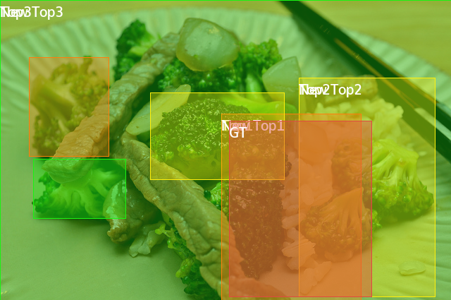

info,img
image_id: 324677old_caption: [CLS] red [SEP]new_caption: [CLS] red 125 [SEP]iou_old: 0.9337480068206787iou_new: 0.0,

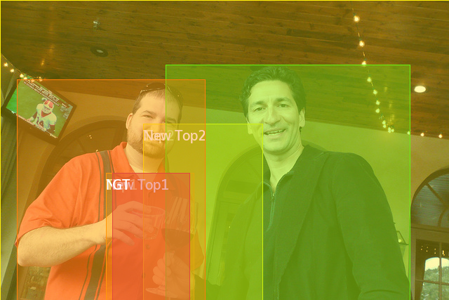

info,img
image_id: 264741old_caption: [CLS] aqua shirt [SEP]new_caption: [CLS] aqua shirt sprinter [SEP]iou_old: 0.9585656523704529iou_new: 0.0,

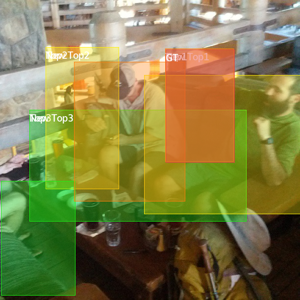

info,img
image_id: 363252old_caption: [CLS] guy in blue shirt with sleeves [SEP]new_caption: [CLS] guy in blue shirt with sleeves winfield [SEP]iou_old: 0.9444869756698608iou_new: 0.13447682559490204,

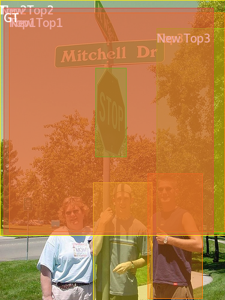

info,img
image_id: 139728old_caption: [CLS] plate with shadow [SEP]new_caption: [CLS] plate with shadow ##tion [SEP]iou_old: 0.791655957698822iou_new: 0.25347083806991577,

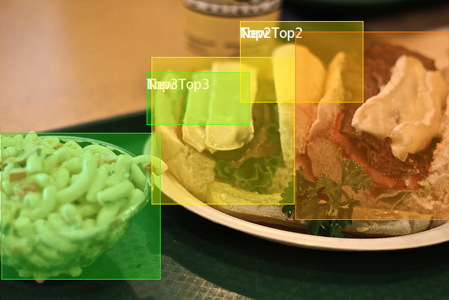

info,img
image_id: 543790old_caption: [CLS] bigger side of cake [SEP]new_caption: [CLS] bigger side of cake swirling [SEP]iou_old: 0.6860514283180237iou_new: 0.07108363509178162,

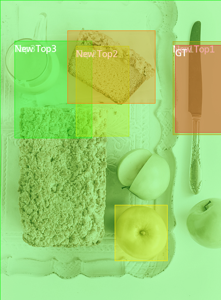

info,img
image_id: 161719old_caption: [CLS] woman in gray shirt [SEP]new_caption: [CLS] woman in gray shirt 202 [SEP]iou_old: 0.828299343585968iou_new: 0.08097245544195175,

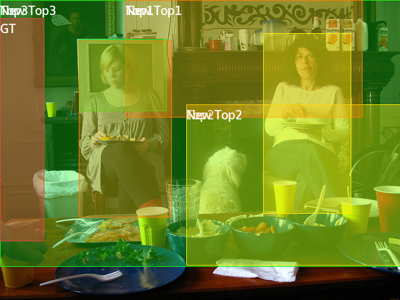

info,img
image_id: 224838old_caption: [CLS] woman in black [SEP]new_caption: [CLS] woman in black atp [SEP]iou_old: 0.8868063688278198iou_new: 0.10898969322443008,

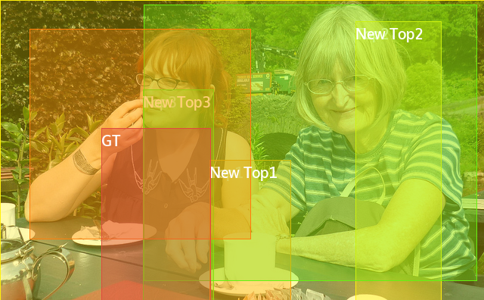

info,img
image_id: 171262old_caption: [CLS] dog with back of head facing us [SEP]new_caption: [CLS] dog with back of head facing us 312 [SEP]iou_old: 0.791655957698822iou_new: 0.25347083806991577,

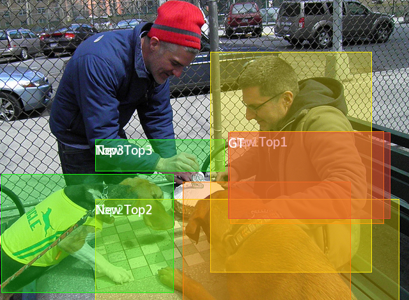

info,img
image_id: 438331old_caption: [CLS] blue shirt [SEP]new_caption: [CLS] blue shirt tomatoes [SEP]iou_old: 0.6860514283180237iou_new: 0.07108363509178162,

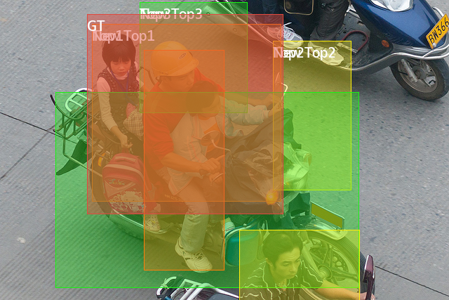

info,img
image_id: 420620old_caption: [CLS] small bike [SEP]new_caption: [CLS] small bike gregorian [SEP]iou_old: 0.681120753288269iou_new: 0.0,

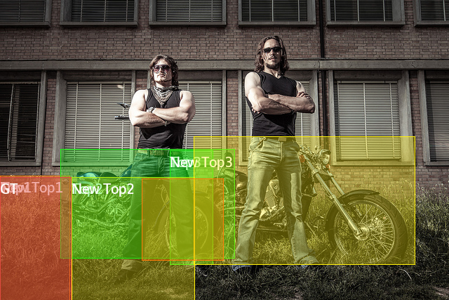

info,img
image_id: 310518old_caption: [CLS] the most hunched over woman with ponytail [SEP]new_caption: [CLS] the most hunched over woman with ponytail filthy [SEP]iou_old: 0.681120753288269iou_new: 0.0,

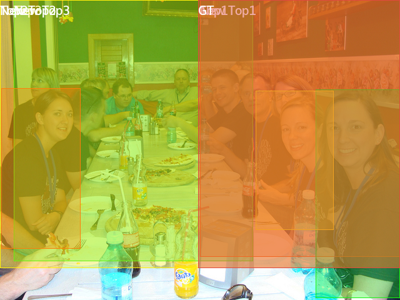

info,img
image_id: 542027old_caption: [CLS] laptop open closest [SEP]new_caption: [CLS] laptop open closest rap [SEP]iou_old: 0.9777432680130005iou_new: 0.018034812062978745,

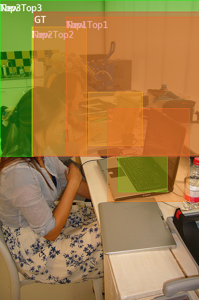

info,img
image_id: 447457old_caption: [CLS] guy with the black shirt [SEP]new_caption: [CLS] guy with the black shirt lyrics [SEP]iou_old: 0.791655957698822iou_new: 0.25347083806991577,

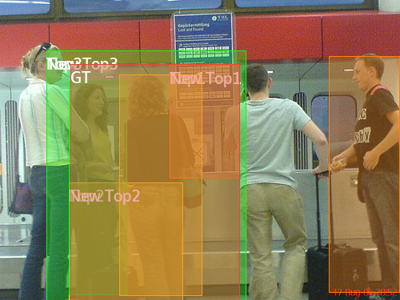

info,img
image_id: 128974old_caption: [CLS] guy one [SEP]new_caption: [CLS] guy one archdiocese [SEP]iou_old: 0.8868063688278198iou_new: 0.10898969322443008,

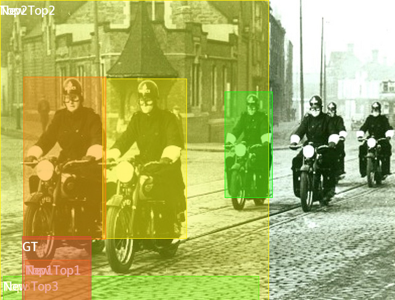

info,img
image_id: 390963old_caption: [CLS] long blonde hair [SEP]new_caption: [CLS] long blonde hair entertained [SEP]iou_old: 0.8972858786582947iou_new: 0.36639946699142456,

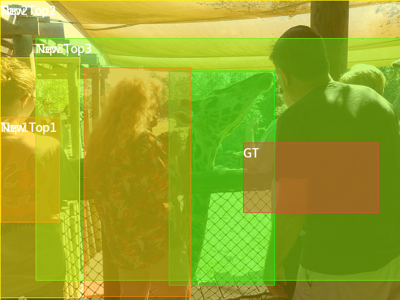

info,img
image_id: 260932old_caption: [CLS] baseball player [SEP]new_caption: [CLS] baseball player kwan [SEP]iou_old: 0.791655957698822iou_new: 0.25347083806991577,

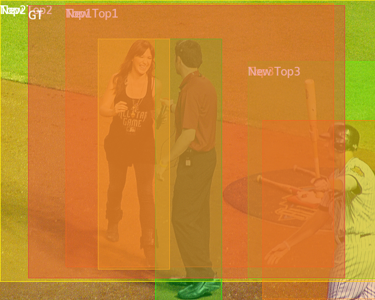

info,img
image_id: 555771old_caption: [CLS] zebra closest west edge ( and i didn ' t notice other st ##ache . ; p ) [SEP]new_caption: [CLS] zebra closest west edge ( and i didn ' t notice other st ##ache . ; p ) ##liteiou_old: 0.9324790239334106iou_new: 0.0,

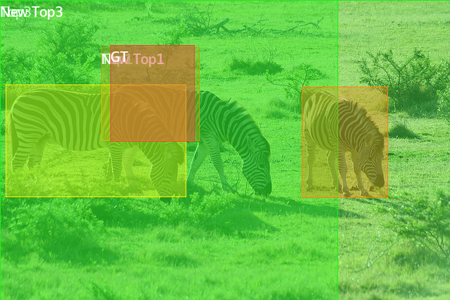

info,img
"image_id: 428109old_caption: [CLS] banana touching corner of sign , trumpet pointing towards it [SEP]new_caption: [CLS] banana touching corner of sign , trumpet pointing towards it margins [SEP]iou_old: 0.9174108505249023iou_new: 0.0",

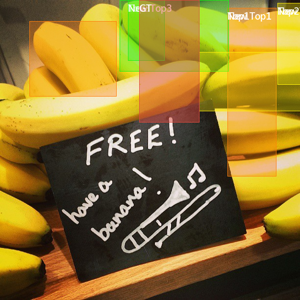

info,img
image_id: 453311old_caption: [CLS] ox facing us [SEP]new_caption: [CLS] ox facing us liability [SEP]iou_old: 0.9644007682800293iou_new: 0.12671874463558197,

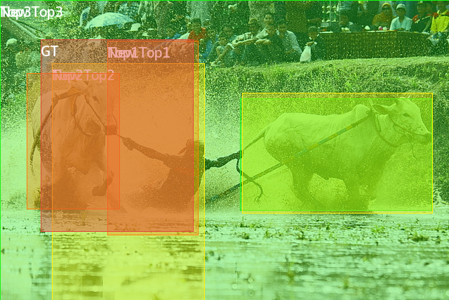

In [15]:
colormap = {
    'gt':['#e04a3f75', '#e04a3f'],
    '1':["#ff7e0b55", "#ff7e0b"],
    '2':["#ffef0b55", "#ffef0b"],
    '3':["#1af21455", "#1af214"],
    '4':["#0a5cff55", "#0a5cff"],
    '5':["#ad11ff55", "#ad11ff"],
    #'6':["#3d6ec940", "#3d6ec9"],
    #'7':["#3d6ec935", "#3d6ec9"],
    #'8':["#3d6ec930", "#3d6ec9"],
}

fnt = ImageFont.truetype("/Users/tingyu/Downloads/Oxygen-Sans-Bold.ttf", 20)

import pdfkit as pdf
import imgkit

for index in index_list:
    datum = valhunger_init[index]
    img_id = image_id_lower[index]['image_id']
    img_file = imgid2file[img_id]
    datum_lower = image_id_lower[index]
    
    img = Image.open(os.path.join(COCOpath, img_file))
    
    # draw top k
    for i in range(2, -1, -1):
        box = ImageDraw.Draw(img, 'RGBA') 
        box.rectangle(datum['topk_boxes'][i][:4], fill = colormap[str(i+1)][0], outline=colormap[str(i+1)][1]) 
        box.text(datum['topk_boxes'][i][:2], f'Top{i+1}', font=fnt)
    # draw new top k
    for i in range(2, -1, -1):
        box = ImageDraw.Draw(img, 'RGBA') 
        box.rectangle(datum_lower['topk_boxes'][i][:4], fill = colormap[str(i+1)][0], outline=colormap[str(i+1)][1]) 
        box.text(datum['topk_boxes'][i][:2], f'New Top{i+1}', font=fnt)
    # draw gt box
    gt_box = ImageDraw.Draw(img, 'RGBA')   
    gt_box.rectangle(datum['gt_box'], fill = colormap['gt'][0], outline=colormap['gt'][1]) 
    gt_box.text(datum['gt_box'][:2], f'GT', font=fnt)


    # resize to plot
    width, height = img.size 
    img = img.resize((int(width * (300/height)), 300))

    text = ''
    for k,v in datum_lower.items():
        if k != 'gt_box' and k != 'topk_boxes':
            text += f'{k}: {v}\n'

    img_buffer = BytesIO()
    img.save(img_buffer, format="PNG")
    imgStr = base64.b64encode(img_buffer.getvalue())
    
    data = pd.DataFrame({"info": [text]})
    data.loc[:,'img'] = '<img src="data:image/png;base64,{0:s}">'
    
    html_all = data.to_html(escape=False, index=False).format(imgStr.decode('ascii')).replace("\\n","<br>").replace('<td>', '<td style="text-align: left">')
    
    # imgkit.from_string(html_all, f'./ref_topk/{index}.png')
    display(HTML(html_all))

In [16]:
random.seed(666)

N = 20

index_list_high = random.sample(range(0, len(image_id_higher)), N)

info,img
image_id: 492138old_caption: [CLS] girl in blue [SEP]new_caption: [CLS] girl in blue entropy [SEP]iou_old: 0.7516748309135437iou_new: 0.7516748309135437,

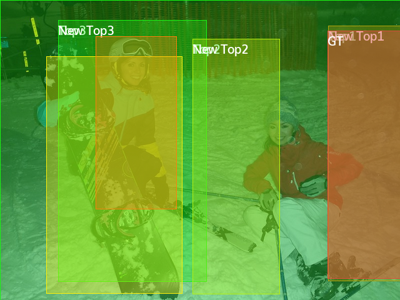

info,img
image_id: 230236old_caption: [CLS] large drink [SEP]new_caption: [CLS] large drink 226 [SEP]iou_old: 0.17520704865455627iou_new: 0.17520704865455627,

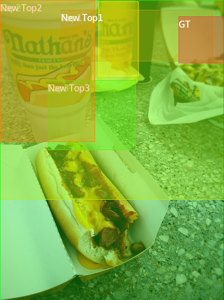

info,img
image_id: 289782old_caption: [CLS] red truck [SEP]new_caption: [CLS] red truck 1944 [SEP]iou_old: 0.9324790239334106iou_new: 0.9324790239334106,

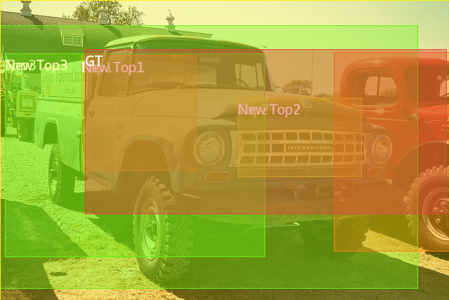

info,img
image_id: 251368old_caption: [CLS] wheel next to person with black shoes and orange thing on the toe [SEP]new_caption: [CLS] wheel next to person with black shoes and orange thing on the toe stifled [SEP]iou_old: 0.009527553804218769iou_new: 0.009527553804218769,

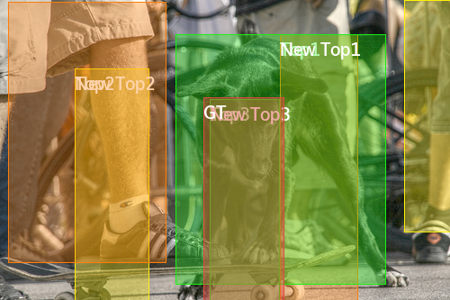

info,img
image_id: 298306old_caption: [CLS] kid with glasses [SEP]new_caption: [CLS] kid with glasses ##grave [SEP]iou_old: 0.825770378112793iou_new: 0.825770378112793,

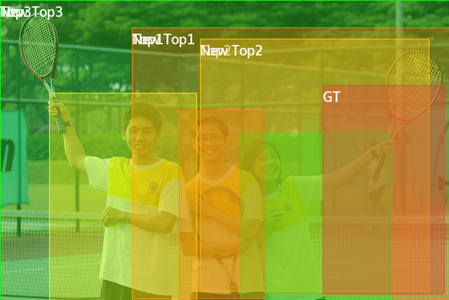

info,img
image_id: 160906old_caption: [CLS] red boat [SEP]new_caption: [CLS] red boat ##uter [SEP]iou_old: 0.8915219306945801iou_new: 0.8915219306945801,

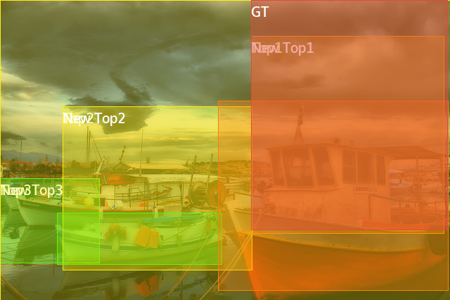

info,img
image_id: 557527old_caption: [CLS] man in light blue jacket [SEP]new_caption: [CLS] man in light blue jacket euros [SEP]iou_old: 0.6118568181991577iou_new: 0.6118568181991577,

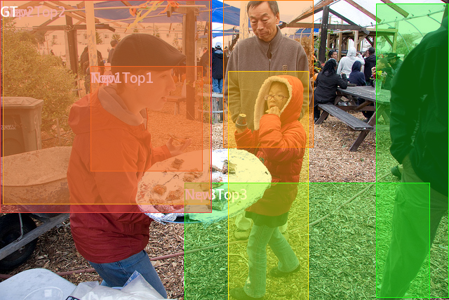

info,img
image_id: 326350old_caption: [CLS] guy closest edge behind 42 [SEP]new_caption: [CLS] guy closest edge behind 42 managing [SEP]iou_old: 0.575825572013855iou_new: 0.575825572013855,

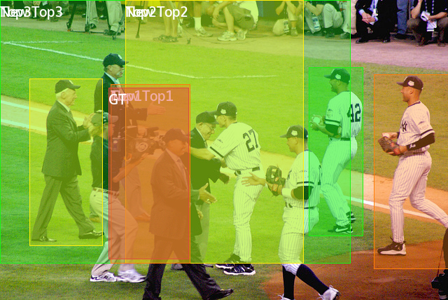

info,img
image_id: 259443old_caption: [CLS] blue shirt [SEP]new_caption: [CLS] blue shirt ##tl [SEP]iou_old: 0.5761561989784241iou_new: 0.5761561989784241,

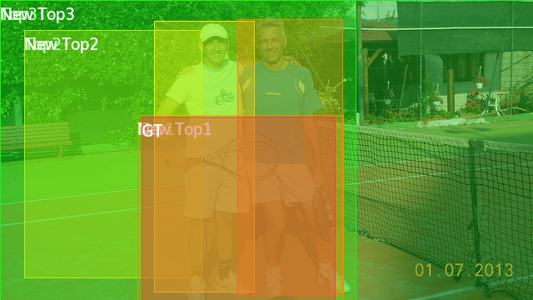

info,img
image_id: 216391old_caption: [CLS] man in white shirt [SEP]new_caption: [CLS] man in white shirt caleb [SEP]iou_old: 0.8451536297798157iou_new: 0.8451536297798157,

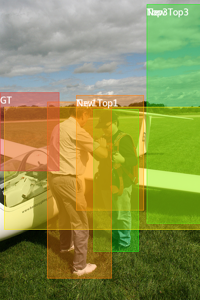

info,img
image_id: 567189old_caption: [CLS] the large black suitcase . [SEP]new_caption: [CLS] the large black suitcase . qualifiers [SEP]iou_old: 0.9107996225357056iou_new: 0.9107996225357056,

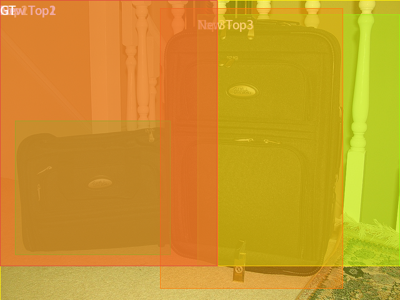

info,img
image_id: 512662old_caption: [CLS] obama [SEP]new_caption: [CLS] obama rand [SEP]iou_old: 0.878900945186615iou_new: 0.878900945186615,

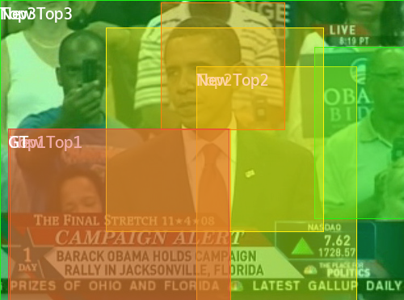

info,img
image_id: 259443old_caption: [CLS] white shirt [SEP]new_caption: [CLS] white shirt wyoming [SEP]iou_old: 0.5761561989784241iou_new: 0.5761561989784241,

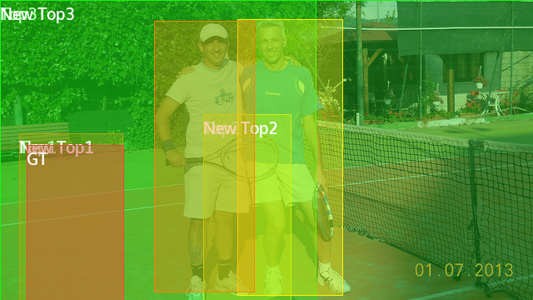

info,img
image_id: 440154old_caption: [CLS] man [SEP]new_caption: [CLS] man jacob [SEP]iou_old: 0.828299343585968iou_new: 0.828299343585968,

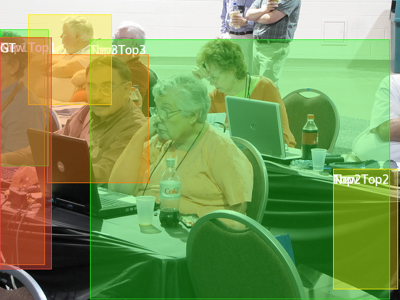

info,img
image_id: 490712old_caption: [CLS] red [SEP]new_caption: [CLS] red ##sby [SEP]iou_old: 0.0iou_new: 0.0,

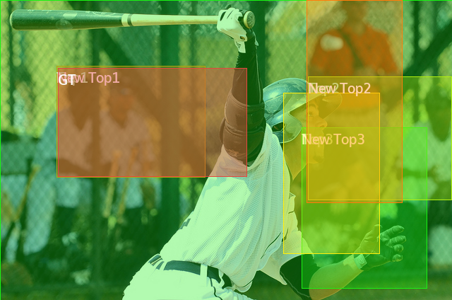

info,img
image_id: 308536old_caption: [CLS] keyboard in ##bt ##wen two mice [SEP]new_caption: [CLS] keyboard in ##bt ##wen two mice restricting [SEP]iou_old: 0.8950994610786438iou_new: 0.8950994610786438,

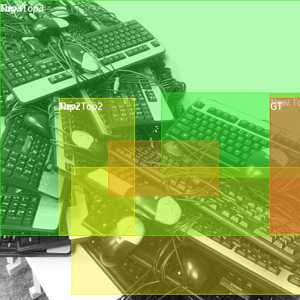

info,img
image_id: 515401old_caption: [CLS] suitcase with cat on it [SEP]new_caption: [CLS] suitcase with cat on it strains [SEP]iou_old: 0.8719374537467957iou_new: 0.8719374537467957,

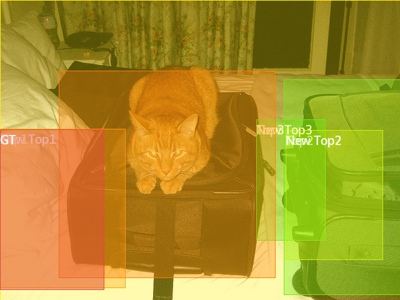

info,img
image_id: 227178old_caption: [CLS] pink pillow [SEP]new_caption: [CLS] pink pillow 1a [SEP]iou_old: 0.9678096175193787iou_new: 0.9678096175193787,

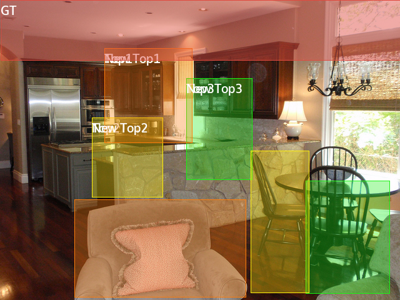

info,img
image_id: 111992old_caption: [CLS] box with red dot . [SEP]new_caption: [CLS] box with red dot . vietnamese [SEP]iou_old: 0.9485591650009155iou_new: 0.9485591650009155,

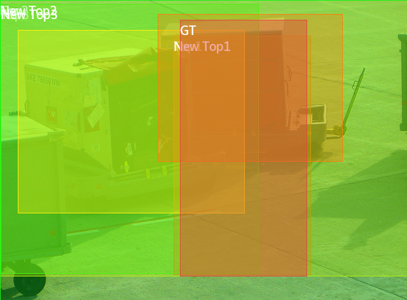

info,img
image_id: 416651old_caption: [CLS] laughing player bas ##i on shirt [SEP]new_caption: [CLS] laughing player bas ##i on shirt simulation [SEP]iou_old: 0.9142211079597473iou_new: 0.9142211079597473,

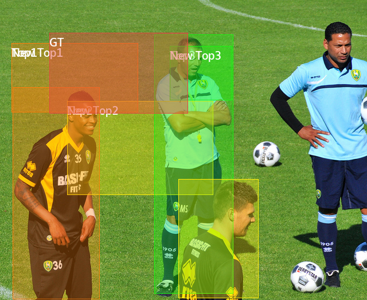

In [17]:
for index in index_list_high:
    datum = valhunger_init[index]
    img_id = image_id_higher[index]['image_id']
    img_file = imgid2file[img_id]
    datum_higher = image_id_higher[index]
    
    img = Image.open(os.path.join(COCOpath, img_file))
    
    # draw top k
    for i in range(2, -1, -1):
        box = ImageDraw.Draw(img, 'RGBA') 
        box.rectangle(datum['topk_boxes'][i][:4], fill = colormap[str(i+1)][0], outline=colormap[str(i+1)][1]) 
        box.text(datum['topk_boxes'][i][:2], f'Top{i+1}', font=fnt)
    # draw new top k
    for i in range(2, -1, -1):
        box = ImageDraw.Draw(img, 'RGBA') 
        box.rectangle(datum_higher['topk_boxes'][i][:4], fill = colormap[str(i+1)][0], outline=colormap[str(i+1)][1]) 
        box.text(datum['topk_boxes'][i][:2], f'New Top{i+1}', font=fnt)
    # draw gt box
    gt_box = ImageDraw.Draw(img, 'RGBA')   
    gt_box.rectangle(datum['gt_box'], fill = colormap['gt'][0], outline=colormap['gt'][1]) 
    gt_box.text(datum['gt_box'][:2], f'GT', font=fnt)


    # resize to plot
    width, height = img.size 
    img = img.resize((int(width * (300/height)), 300))

    text = ''
    for k,v in datum_higher.items():
        if k != 'gt_box' and k != 'topk_boxes':
            text += f'{k}: {v}\n'

    img_buffer = BytesIO()
    img.save(img_buffer, format="PNG")
    imgStr = base64.b64encode(img_buffer.getvalue())
    
    data = pd.DataFrame({"info": [text]})
    data.loc[:,'img'] = '<img src="data:image/png;base64,{0:s}">'
    
    html_all = data.to_html(escape=False, index=False).format(imgStr.decode('ascii')).replace("\\n","<br>").replace('<td>', '<td style="text-align: left">')
    
    # imgkit.from_string(html_all, f'./ref_topk/{index}.png')
    display(HTML(html_all))
